In [ ]:
import glob
import numpy as np
import csv
import pandas as pd
from pathlib import Path

for dataset_type in ["Learning_org", "Test_org"]:
    results = [["filepath", "waveform_size", "waveform_components", "p_idx", "s_idx", "start_idx"]]
    for fn in glob.glob(f"data/{dataset_type}/*"):
        data = np.load(fn)
        waveform = data["wave"]
        waveform_shape = waveform.shape
        components = waveform.shape[0]
        waveform_size = waveform.shape[1] 
        pidx = data["pidx"]
        sidx = data["sidx"]
        if sidx + 500 > 3000:
            if pidx - 500 + 3000 > waveform_size:
                start_idx = waveform_size - 3000
            else:
                start_idx = pidx - 500
        else:
            start_idx = 0
        results.append([fn, waveform_size, components, pidx, sidx, start_idx])

    with open(f"data/{dataset_type}/fileinfo.csv", "w") as csvfile:
        writer = csv.writer(csvfile)
        writer.writerows(results)

In [ ]:
import numpy as np
from pathlib import Path
from tqdm import tqdm
import pandas as pd

def modify_data(waveform, pidx, sidx, start_idx):
    modified_waveform = waveform[:, start_idx: start_idx+3000]
    modified_pidx = pidx - start_idx
    modified_sidx = sidx - start_idx
    return modified_waveform, modified_pidx, modified_sidx

for dataset_type in ["Learning_org", "Test_org"]:
    save_dir = Path(f"data/{dataset_type.replace('_org', '')}")
    save_dir.mkdir(parents=True, exist_ok=True)
    df = pd.read_csv(f"data/{dataset_type}/fileinfo.csv")
    # print(df)
    for (fn, start_idx) in tqdm(df[["filepath", "start_idx"]].values, total=len(df)):
        data = np.load(fn)
        waveform = data["wave"]
        pidx = data["pidx"]
        sidx = data["sidx"]
        modified_waveform, modified_pidx, modified_sidx = modify_data(waveform, pidx, sidx, start_idx)
        np.savez(
            fn.replace("_org", ""), 
            wave=modified_waveform, 
            pidx=modified_pidx,
            sidx=modified_sidx
        )

                                        filepath  waveform_size  \
0     data/Learning_org/110904.230508_E.SSHM.npz          18000   
1     data/Learning_org/110909.035637_E.MD1M.npz          18000   
2     data/Learning_org/110905.113432_E.NKMM.npz          18000   
3     data/Learning_org/110907.203425_E.MD1M.npz          18000   
4     data/Learning_org/110907.174211_E.TK2M.npz          18000   
...                                          ...            ...   
4930  data/Learning_org/110915.044239_E.TKWM.npz          18000   
4931  data/Learning_org/110909.035637_E.HSDM.npz          18000   
4932  data/Learning_org/110907.023006_E.TACM.npz          18000   
4933  data/Learning_org/110910.065515_E.MD1M.npz          18000   
4934  data/Learning_org/110912.174331_E.NKMM.npz          18000   

      waveform_components  p_idx  s_idx  start_idx  
0                       3   1820   3220       1320  
1                       3   1184   1921          0  
2                       3   1340   2

100%|██████████| 4935/4935 [00:06<00:00, 816.55it/s]


                                   filepath  waveform_size  \
0    data/Test_org/110912.212733_E.MOKM.npz          18000   
1    data/Test_org/110907.233718_E.NKMM.npz          18000   
2    data/Test_org/110909.025935_E.NKMM.npz          18000   
3    data/Test_org/110912.000809_E.IIDM.npz          18000   
4    data/Test_org/110910.103308_E.TACM.npz          18000   
..                                      ...            ...   
495  data/Test_org/110906.125956_E.SRTM.npz          18000   
496  data/Test_org/110911.020052_E.TKWM.npz          18000   
497  data/Test_org/110913.014007_E.MOKM.npz          18000   
498  data/Test_org/110912.193913_E.TK2M.npz          18000   
499  data/Test_org/110905.180300_E.TKWM.npz          18000   

     waveform_components  p_idx  s_idx  start_idx  
0                      3   1137   1663          0  
1                      3   1400   2468          0  
2                      3    842   1613          0  
3                      3    960   1880         

100%|██████████| 500/500 [00:00<00:00, 1733.90it/s]


In [23]:
import os
import glob
import numpy as np
import torch
from pathlib import Path
from sklearn.model_selection import train_test_split
from obspy import Stream, Trace, UTCDateTime
from tqdm import tqdm
import seisbench.models as sbm

from scipy.signal import ShortTimeFFT

# === DeepDenoiser モデルロード ===
model = sbm.DeepDenoiser.from_pretrained("original")

# === パラメータ ===
SAMPLE_RATE = 100
WIN_LENGTH = 30
HOP_LENGTH = 15
N_FFT = 60
EPS = 1e-8

SFT = ShortTimeFFT(
    win=np.hanning(WIN_LENGTH),
    hop=HOP_LENGTH,
    fs=SAMPLE_RATE,
    fft_mode="onesided2X",
    mfft=N_FFT,
    scale_to="magnitude",
)

# === ディレクトリ設定 ===
input_dir = "data/Learning"
output_root = Path("datasets_mask")
train_dir = output_root / "train"
val_dir = output_root / "val"
train_dir.mkdir(parents=True, exist_ok=True)
val_dir.mkdir(parents=True, exist_ok=True)

# === ObsPy変換関数 ===
def convert_ndarry_stream(data, time_str, station_name, sampling_rate=100):
    year = 2000 + int(time_str[:2])
    month, day = int(time_str[2:4]), int(time_str[4:6])
    hour, minute, second = int(time_str[7:9]), int(time_str[9:11]), int(time_str[11:13])
    utc_time = UTCDateTime(year, month, day, hour, minute, second)
    channels = ["UD", "NS", "EW"]
    stream = Stream()
    for i, ch in enumerate(channels):
        trace = Trace(data=data[i])
        trace.stats.update({
            "sampling_rate": sampling_rate,
            "starttime": utc_time,
            "network": "MeSO-net",
            "station": station_name,
            "location": "",
            "channel": ch,
        })
        stream.append(trace)
    return stream

def convert_stream_to_ndarray(stream, channel_order=["UD", "NS", "EW"]):
    traces = []
    for ch in channel_order:
        tr = stream.select(channel=ch)
        if len(tr) == 0:
            raise ValueError(f"Channel {ch} not found in the stream.")
        traces.append(tr[0].data)
    return np.stack(traces)

# === スペクトログラム計算（real/imag） + マスク計算 ===
def compute_spec_and_mask(wave, denoised):
    spec_list = []
    mask_list = []
    for i in range(3):  # for each component
        Zxx_noisy = SFT.stft(wave[i])
        Zxx_clean = SFT.stft(denoised[i])
        
        spec_real = np.real(Zxx_noisy)
        spec_imag = np.imag(Zxx_noisy)
        mag_mask = np.abs(Zxx_clean) / (np.abs(Zxx_noisy) + EPS)
        mag_mask = np.clip(mag_mask, 0.0, 1.0)  

        spec_list.append(spec_real)
        spec_list.append(spec_imag)
        mask_list.append(mag_mask)

    spec_array = np.stack(spec_list, axis=0)   # [6, F, T]
    mask_array = np.stack(mask_list, axis=0)   # [3, F, T]

    for i in range(3):
        real = spec_array[2*i]
        imag = spec_array[2*i+1]
        
        mean_real = np.mean(real)
        std_real = np.std(real) + 1e-6
        spec_array[2*i] = (real - mean_real) / std_real

        mean_imag = np.mean(imag)
        std_imag = np.std(imag) + 1e-6
        spec_array[2*i+1] = (imag - mean_imag) / std_imag
    
    return spec_array.astype(np.float32), mask_array.astype(np.float32)

# === ファイル一覧取得 & 分割 ===
npz_files = sorted(glob.glob(os.path.join(input_dir, "*.npz")))
train_files, val_files = train_test_split(npz_files, test_size=0.05, random_state=42)

# === 処理関数（ノイズ拡張あり）===
def process_and_save(file_list, out_dir, add_noise=True, num_augments=2):
    for fn in tqdm(file_list, desc=f"Processing {out_dir.name}"):
        data = np.load(fn)
        wave = data["wave"].astype(np.float32)  # (3, 3000)
        wave -= np.mean(wave, axis=1, keepdims=True)
        pidx = int(data["pidx"])
        sidx = int(data["sidx"])

        try:
            time_str, station_name = os.path.basename(fn).replace(".npz", "").split("_")
        except Exception as e:
            print(f"[WARN] Skipping invalid filename {fn}: {e}")
            continue

        try:
            original_stream = convert_ndarry_stream(wave, time_str, station_name)
            denoised_stream = model.annotate(original_stream)

            denoised = convert_stream_to_ndarray(
                denoised_stream,
                channel_order=["DeepDenoiser_UD", "DeepDenoiser_NS", "DeepDenoiser_EW"]
            ).astype(np.float32)

        except Exception as e:
            print(f"[WARN] Failed to denoise {fn}: {e}")
            continue

        denoised[:, :pidx] = 0

        # 元のスペクトル・マスク
        spec, mask = compute_spec_and_mask(wave, denoised)
        base_name = os.path.basename(fn).replace(".npz", "")
        
        # 元データ保存
        save_dict = {
            "spec": torch.from_numpy(spec),
            "mask": torch.from_numpy(mask),
            "pidx": pidx,
            "sidx": sidx,
            "name": f"{base_name}.pt"
        }
        torch.save(save_dict, out_dir / save_dict["name"])

        # === ノイズ付き拡張 ===
        if add_noise:
            for aug_id in range(num_augments):
                noise_strength = np.random.uniform(0.2, 0.5)
                std_per_channel = np.std(wave, axis=1, keepdims=True)
                noise = np.random.normal(scale=std_per_channel * noise_strength, size=wave.shape).astype(np.float32)
                noisy_wave = wave + noise
                noisy_wave -= np.mean(noisy_wave, axis=1, keepdims=True)

                spec_aug, _ = compute_spec_and_mask(noisy_wave, denoised)  # マスクは使い回し
                aug_dict = {
                    "spec": torch.from_numpy(spec_aug),
                    "mask": torch.from_numpy(mask),
                    "pidx": pidx,
                    "sidx": sidx,
                    "name": f"{base_name}_aug{aug_id}.pt"
                }
                torch.save(aug_dict, out_dir / aug_dict["name"])

# === 実行 ===
process_and_save(train_files, train_dir, add_noise=True, num_augments=3)
process_and_save(val_files, val_dir, add_noise=False)

print(f"✅ Saved {len(train_files)} original + augmented training samples to {train_dir}")
print(f"✅ Saved {len(val_files)} validation samples to {val_dir}")


Processing val: 100%|██████████| 247/247 [00:06<00:00, 39.82it/s]

✅ Saved 4688 original + augmented training samples to datasets_mask/train
✅ Saved 247 validation samples to datasets_mask/val


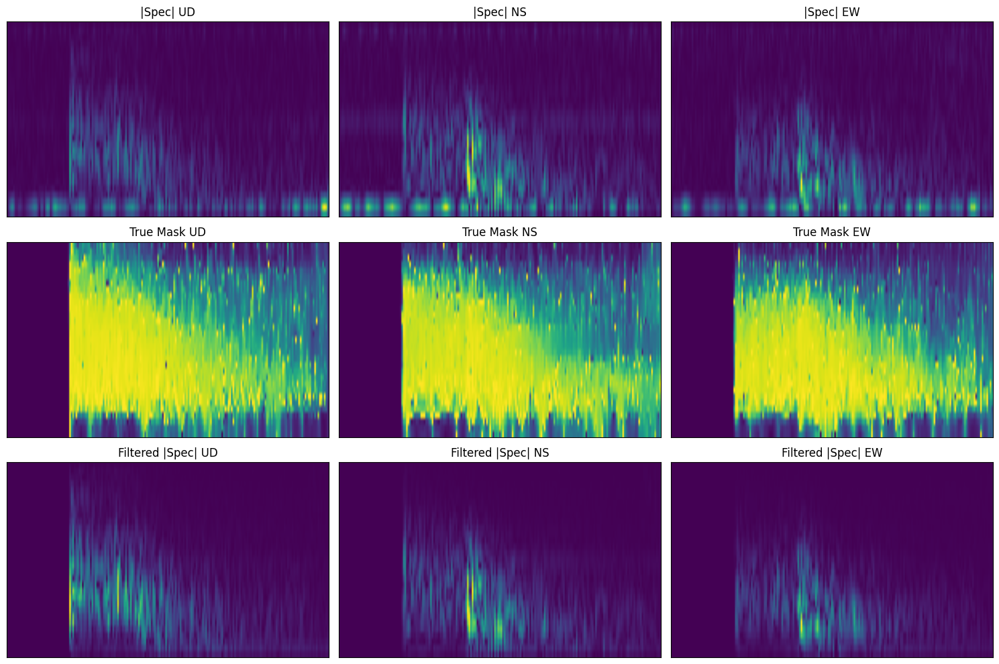

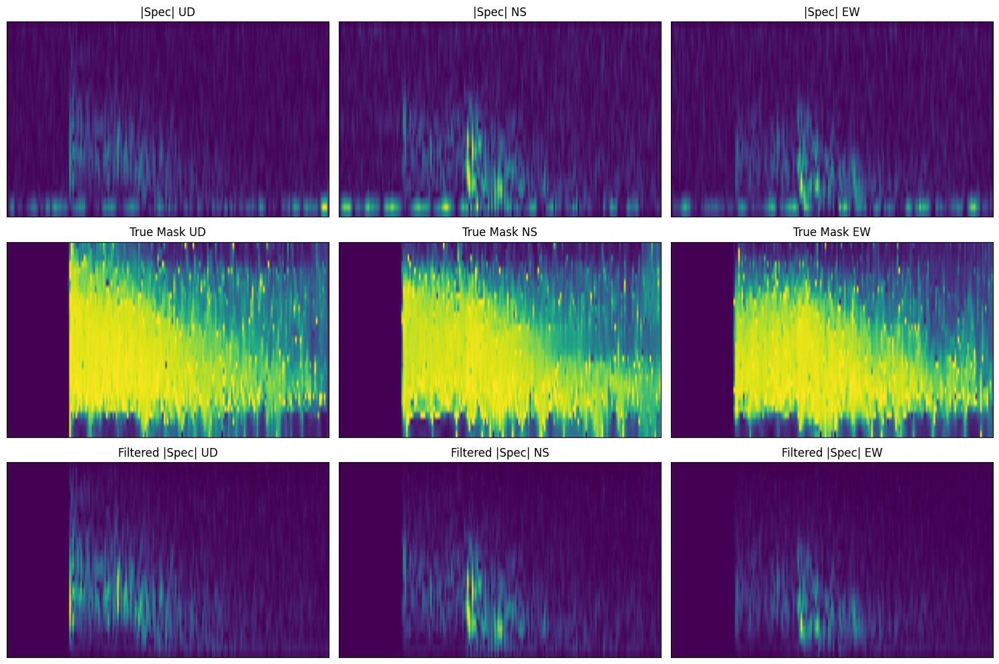

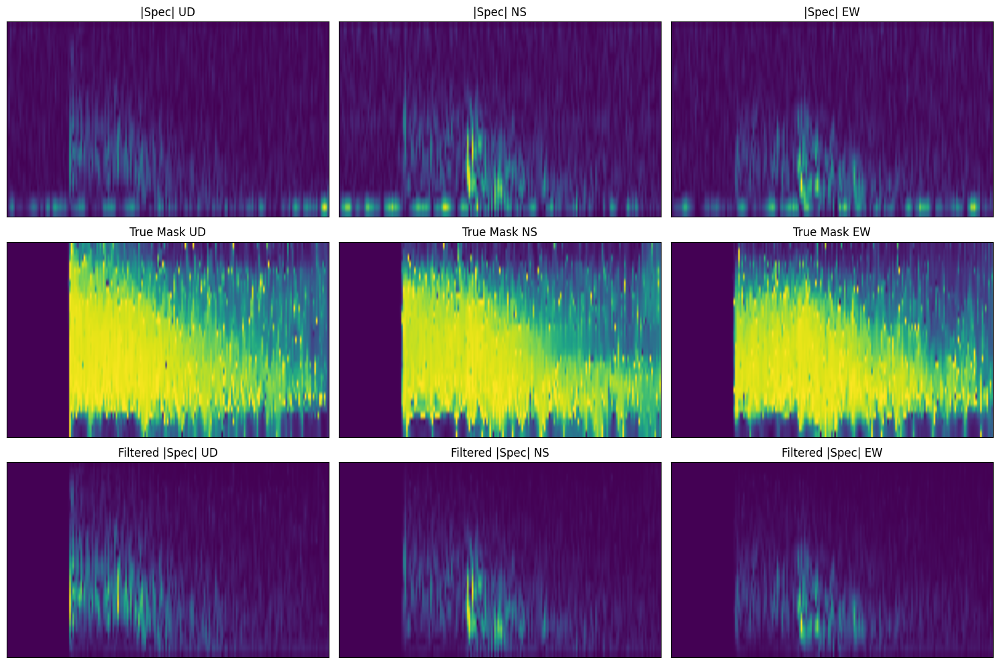

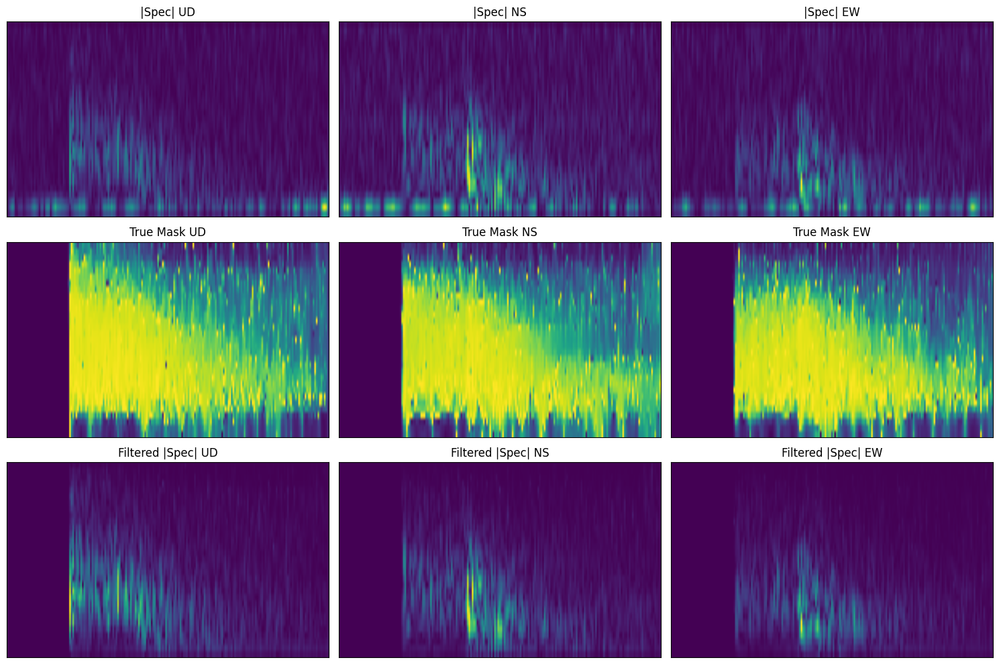

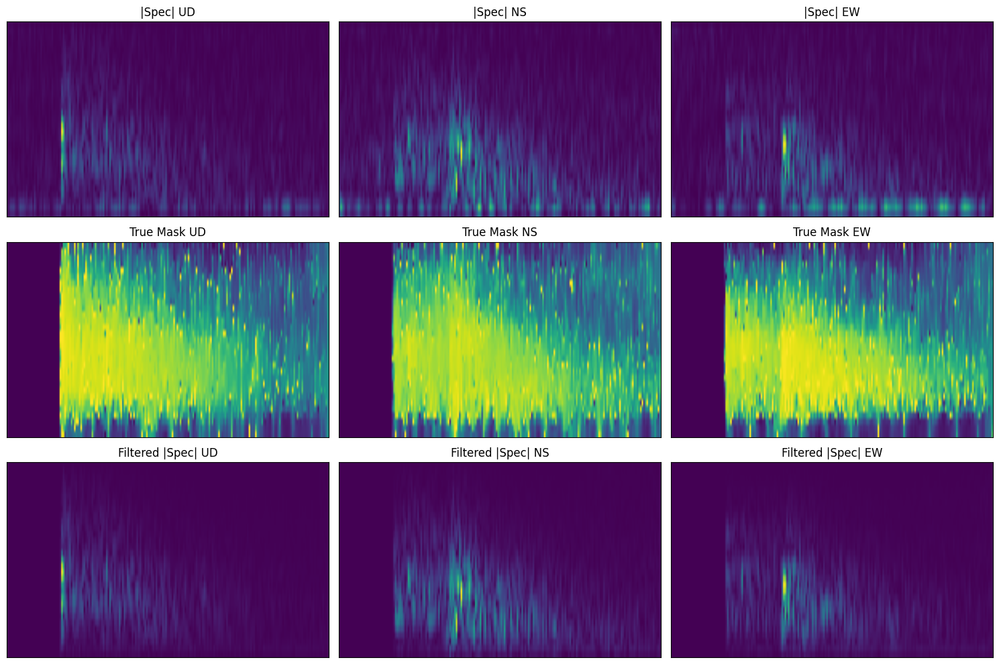

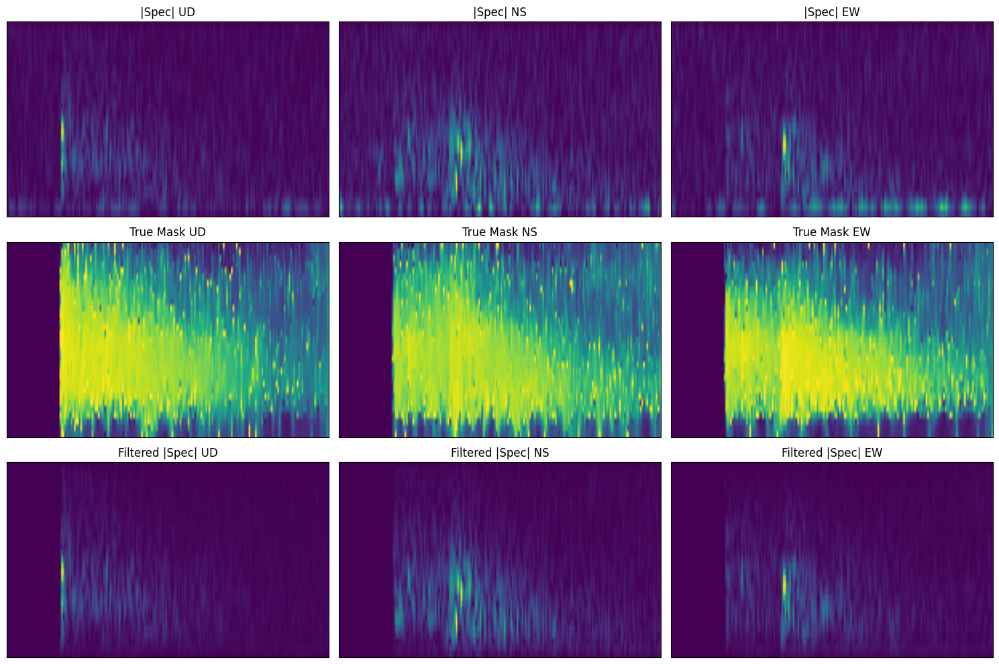

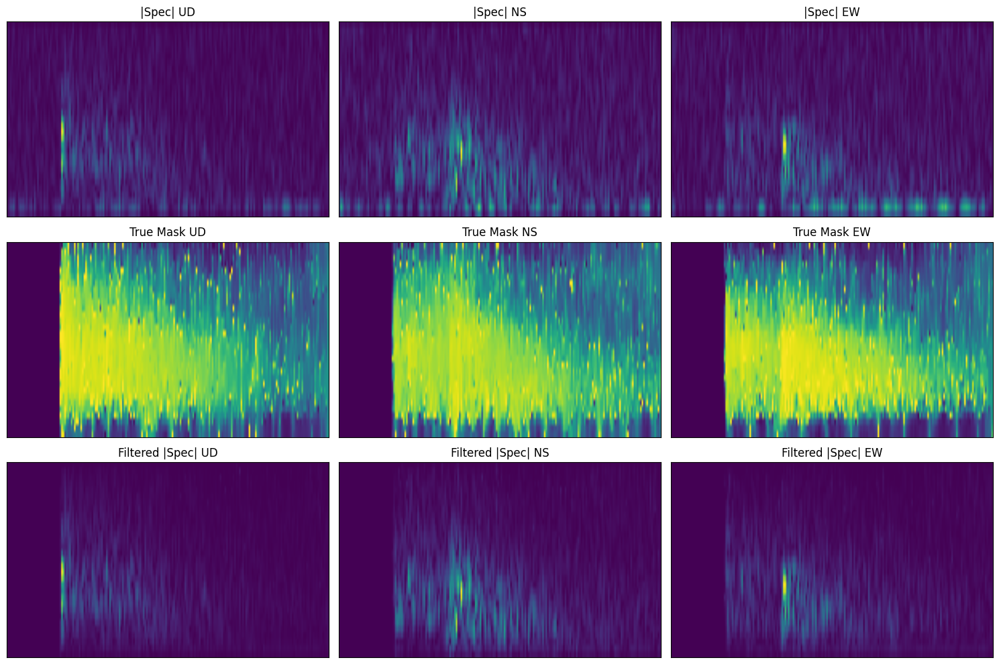

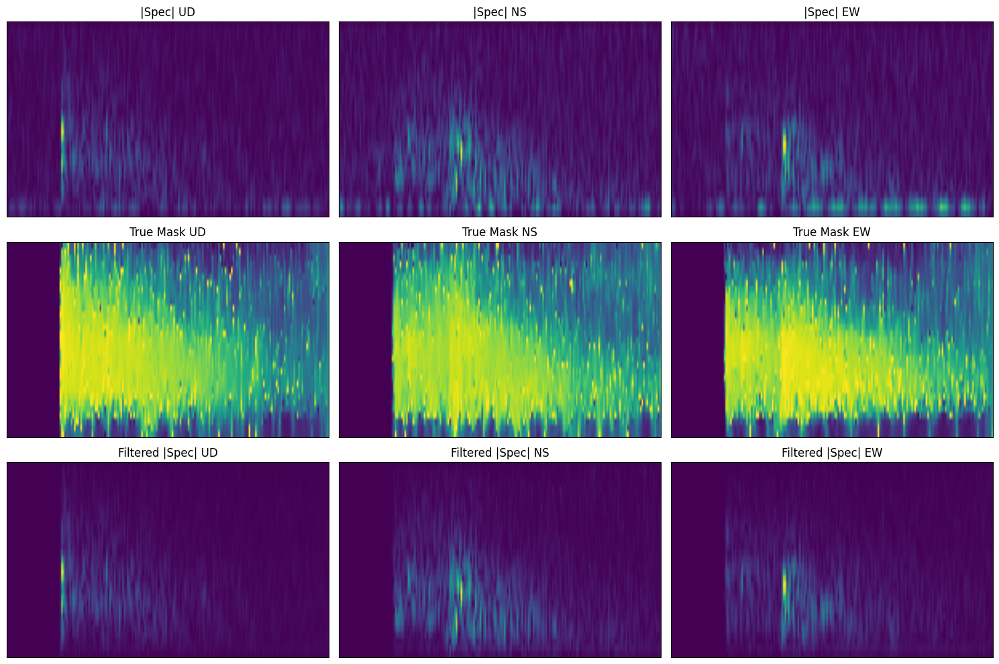

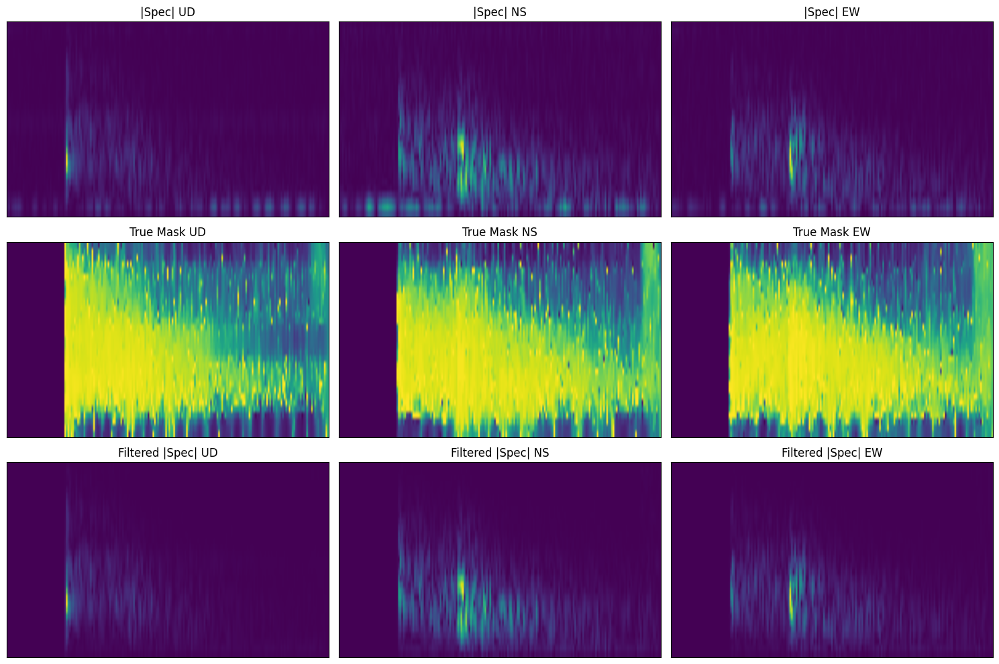

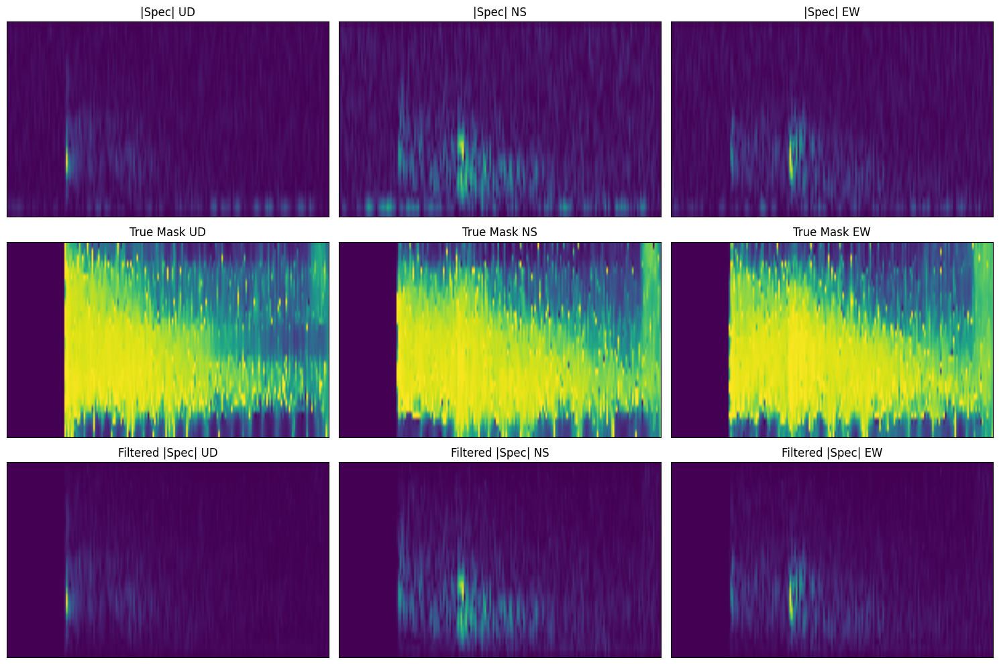

In [ ]:
import os
import torch
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path

def visualize_pt_file(filepath, output_dir="viz_output"):
    data = torch.load(filepath)
    spec = data["spec"].float().unsqueeze(0)  # [1, 6, F, T]
    mask = data["mask"].float().unsqueeze(0)  # [1, 3, F, T]

    os.makedirs(output_dir, exist_ok=True)

    titles = ["UD", "NS", "EW"]
    spec_mag = (spec[:, 0::2]**2 + spec[:, 1::2]**2).sqrt()  # [1, 3, F, T]
    filtered = spec_mag * mask  # マスク適用後スペクトル

    fig, axes = plt.subplots(3, 3, figsize=(15, 10))
    for i in range(3):
        axes[0, i].imshow(spec_mag[0, i].cpu(), aspect="auto", origin="lower")
        axes[0, i].set_title(f"|Spec| {titles[i]}")
        axes[1, i].imshow(mask[0, i].cpu(), aspect="auto", origin="lower", vmin=0, vmax=1)
        axes[1, i].set_title(f"True Mask {titles[i]}")
        axes[2, i].imshow(filtered[0, i].cpu(), aspect="auto", origin="lower")
        axes[2, i].set_title(f"Filtered |Spec| {titles[i]}")

    for ax in axes.flat:
        ax.set_xticks([])
        ax.set_yticks([])

    plt.tight_layout()
    plt.show()


if __name__ == "__main__":
    # 可視化したいファイルをいくつか指定（例：train ディレクトリから先頭5件）
    sample_dir = Path("datasets_mask/train")
    pt_files = sorted(sample_dir.glob("*.pt"))[:10]  # ←必要に応じて数変更

    for pt_file in pt_files:
        visualize_pt_file(pt_file)
